All imports:

In [55]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

Define display function

In [56]:
def display_image(mat_like, cmap="rgb"):
    plt.figure()
    if cmap != "rgb":
        plt.imshow(mat_like, cmap=cmap)
    else:
        plt.imshow(mat_like)
    plt.show()
    plt.close()

load root folder and file location

In [57]:
current_folder = os.getcwd()
root_data_folder = os.path.join(current_folder, "local_data")
random_frames_folder = os.path.join(root_data_folder, "random_frames")
sequence_1_folder = os.path.join(root_data_folder, "sequence_1")
sequence_2_folder = os.path.join(root_data_folder, "sequence_2")
sequence_3_folder = os.path.join(root_data_folder, "sequence_3")
sequence_4_folder = os.path.join(root_data_folder, "sequence_4")

Clean image function

In [58]:
dil_kernel_size = 15
dil_kernel = cv2.getStructuringElement(
    cv2.MORPH_ELLIPSE, (dil_kernel_size, dil_kernel_size)
)


def clean_image(gray, display=False):
    if display:
        display_image(gray, "gray")
        
    gray = cv2.medianBlur(gray, 31)  # blur
    if display:
        display_image(gray, "gray")

    gray = cv2.equalizeHist(gray)  # equalize
    if display:
        display_image(gray, "gray")

    gray = 255 - gray  # inverse
    if display:
        display_image(gray, "gray")

    _, gray = cv2.threshold(gray, 230, 255, cv2.THRESH_BINARY)  # threshold
    if display:
        display_image(gray, "gray")

    gray = cv2.dilate(gray, dil_kernel, iterations=3)  # dilate
    if display:
        display_image(gray, "gray")

    gray = cv2.erode(gray, dil_kernel, iterations=8)  # erode
    if display:
        display_image(gray, "gray")

    gray = cv2.dilate(gray, dil_kernel, iterations=6)
    if display:
        display_image(gray, "gray")

    return gray

find circles function

In [59]:
def get_circles_from_gray(gray, color=None):
    gray = clean_image(gray)
    # display_image(gray, "gray")
    circles = cv2.HoughCircles(
        gray,
        cv2.HOUGH_GRADIENT,
        dp=1,  # down sample size
        minDist=400,  # minimum distance between detected circles
        param1=9,
        param2=13,
        minRadius=50,
        maxRadius=100,
    )

    if circles is None:
        return []

    color_img_cpy = np.copy(color)
    circles = np.int64(np.around(circles))
    circles = circles[0, :]

    if color is None:
        return circles

    for circle in circles:
        x, y, r = circle[0], circle[1], circle[2]
        cv2.circle(color_img_cpy, (x, y), r, (255, 255, 255), 15)
    # display_image(color_img_cpy)
    return circles


def merge_circle_arr(res, add):
    for circle_new in add:
        x_new, y_new, r_new = circle_new[0], circle_new[1], circle_new[2]
        for old_circle_dict in res:
            x_old = np.int64(old_circle_dict["x"])
            y_old = np.int64(old_circle_dict["y"])
            r_old = np.int64(old_circle_dict["radius"])
            
            p1 = np.array([x_new, y_new], dtype=np.int64)
            p2 = np.array([x_old, y_old], dtype=np.int64)
            values = p1 - p2
            distance = np.linalg.norm(values)
            if distance < 100:
                x_new = (x_new + x_old) // 2
                y_new = (y_new + y_old) // 2
                r_new = np.max(np.array([r_new, r_old]))
                
                old_circle_dict["x"] = int(x_new)
                old_circle_dict["y"] = int(y_new)
                old_circle_dict["radius"] = int(r_new)
                r_new = -1
                break

        if r_new > 0:
            circle_dict = {}
            circle_dict["x"] = int(x_new)
            circle_dict["y"] = int(y_new)
            circle_dict["radius"] = int(r_new)
            res.append(circle_dict)


def get_colored_circles(color, display=False):
    r, g, b = cv2.split(color)

    r_circles = get_circles_from_gray(r, color)
    g_circles = get_circles_from_gray(g, color)
    b_circles = get_circles_from_gray(b, color)

    result = []
    merge_circle_arr(result, r_circles)
    merge_circle_arr(result, g_circles)
    merge_circle_arr(result, b_circles)

    if not display:
        return result

    img_copy = np.copy(color)
    for circle in result:
        x, y, r = circle["x"], circle["y"], circle["radius"]
        cv2.circle(img_copy, (x, y), r, (255, 255, 255), 15)

    display_image(img_copy)
    return result

load one image for testing

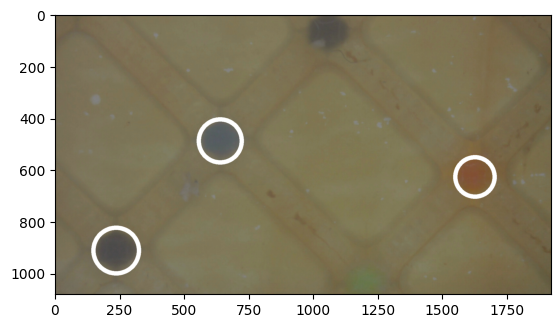

[{'x': 638, 'y': 489, 'radius': 83, 'color': 'red'},
 {'x': 236, 'y': 912, 'radius': 88, 'color': 'red'},
 {'x': 1622, 'y': 628, 'radius': 76, 'color': 'red'}]

In [ ]:
orange = np.array([123, 85, 66], dtype=np.int64)
light_blue = np.array([60, 76, 101], dtype=np.int64)
gray = np.array([60, 70, 70], dtype=np.int64)
green = np.array([93, 111, 70], dtype=np.int64)
color_values = [
    orange, light_blue, gray, green
]
color_names = [
    "red", "blue", "gray", "green"
]


def get_color_name(color):
    color_int = np.array(color, dtype=np.int64)
    min_distance =  np.linalg.norm(color_int - color[0])
    min_color_idx = 0
    
    for i in range(len(color_values)):
        distance = np.linalg.norm(color - color_values[i])
        if distance < min_distance:
            min_color_idx = i
            min_distance = distance
    
    return color_names[min_color_idx]
    

def detect_colored_circles(img_path):
    rnd_img = cv2.imread(img_path)
    color_rgb = cv2.cvtColor(rnd_img, cv2.COLOR_BGR2RGB)
    circles = get_colored_circles(color_rgb)
    
    for circle in circles:
        x, y, r = circle["x"], circle["y"], circle["radius"]
        mask = np.zeros(color_rgb.shape[:2], dtype=np.uint8)
        cv2.circle(mask, (x, y), r // 2, 255, thickness=-1)
        mean_color = cv2.mean(color_rgb, mask=mask)
        mean_color = np.int64(np.around(mean_color))[:3]
        circle["color"] = get_color_name(mean_color)
        
    return circles

img_path = os.path.join(sequence_3_folder, "seq_000.jpg")
detect_colored_circles(img_path)

Now starting part 2 of the exercise!

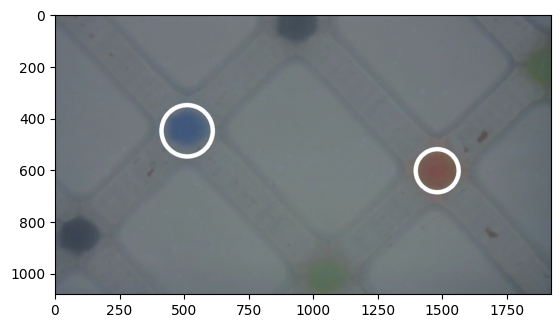

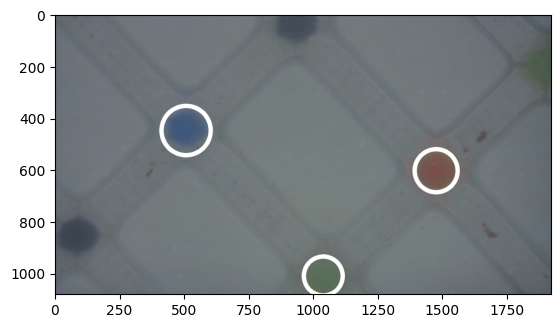

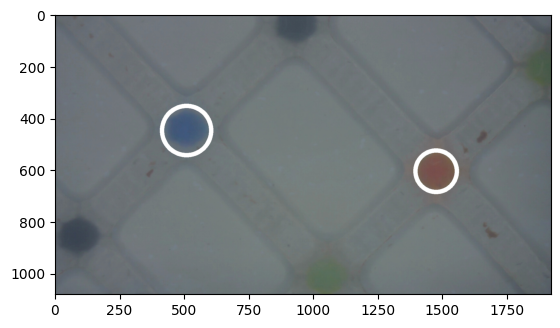

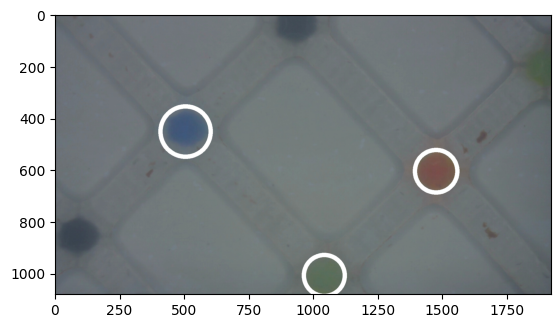

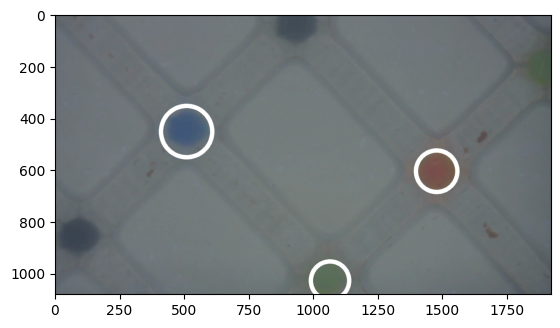

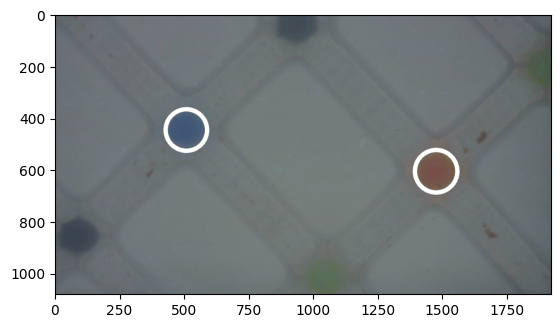

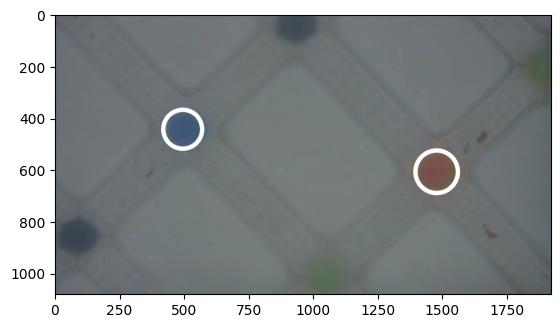

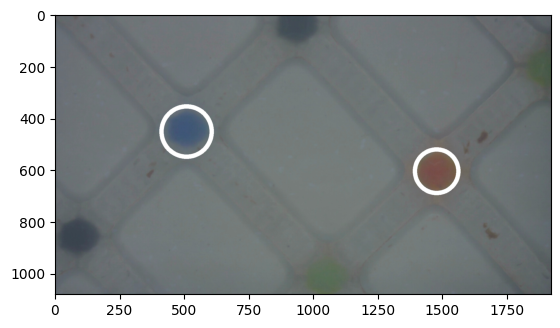

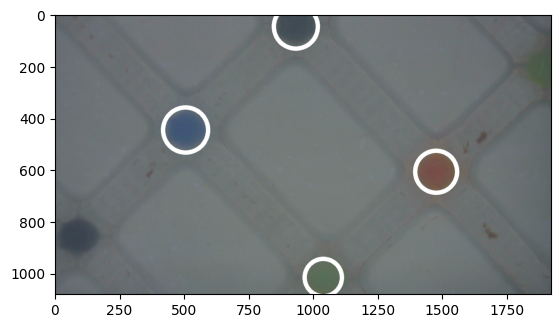

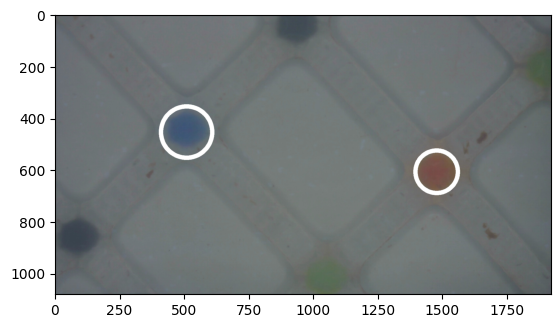

{'image_id': 1, 'circle_id': 1, 'x': 510, 'y': 450, 'radius': 99, 'color': 'blue'}
{'image_id': 1, 'circle_id': 2, 'x': 1476, 'y': 604, 'radius': 83, 'color': 'red'}
{'image_id': 2, 'circle_id': 1, 'x': 506, 'y': 449, 'radius': 95, 'color': 'blue'}
{'image_id': 2, 'circle_id': 3, 'x': 1036, 'y': 1010, 'radius': 75, 'color': 'red'}
{'image_id': 2, 'circle_id': 2, 'x': 1472, 'y': 604, 'radius': 83, 'color': 'red'}
{'image_id': 3, 'circle_id': 1, 'x': 508, 'y': 449, 'radius': 95, 'color': 'blue'}
{'image_id': 3, 'circle_id': 2, 'x': 1472, 'y': 606, 'radius': 80, 'color': 'red'}
{'image_id': 4, 'circle_id': 1, 'x': 504, 'y': 453, 'radius': 97, 'color': 'blue'}
{'image_id': 4, 'circle_id': 3, 'x': 1040, 'y': 1008, 'radius': 79, 'color': 'red'}
{'image_id': 4, 'circle_id': 2, 'x': 1472, 'y': 606, 'radius': 82, 'color': 'red'}
{'image_id': 5, 'circle_id': 1, 'x': 508, 'y': 453, 'radius': 99, 'color': 'blue'}
{'image_id': 5, 'circle_id': 3, 'x': 1062, 'y': 1028, 'radius': 74, 'color': 'red'}
{

In [61]:
def track_circles_over_time(img_paths):
    circles_from_images = []
    for img_path in img_paths:
        circles_from_images.append(detect_colored_circles(img_path))
    
    result = []
    circle_amount = 0
    for idx in range(len(circles_from_images)):
        circles = circles_from_images[idx]
        for circle in circles:
            x_new = circle["x"]
            y_new = circle["y"]
            
            circle_amount += 1
            circle_id = circle_amount
            for res in result:
                x_old = res["x"]
                y_old = res["y"]
                
                p1 = np.array([x_new, y_new], dtype=np.int64)
                p2 = np.array([x_old, y_old], dtype=np.int64)
                values = p1 - p2
                distance = np.linalg.norm(values)
                if distance < 100:
                    circle_id = res["circle_id"]
                    circle_amount -= 1
                    break

            new_res = {}
            new_res["image_id"] = int(idx + 1)
            new_res["circle_id"] = int(circle_id)
            new_res["x"] = int(circle["x"])
            new_res["y"] = int(circle["y"])
            new_res["radius"] = int(circle["radius"])
            new_res["color"] = circle["color"]
            result.append(new_res)
    
    return result
        
        
img_lst = os.listdir(sequence_2_folder)
img_paths = [os.path.join(sequence_1_folder, img_fn) for img_fn in img_lst]
res = track_circles_over_time(img_paths)
for d in res:
    print(d)

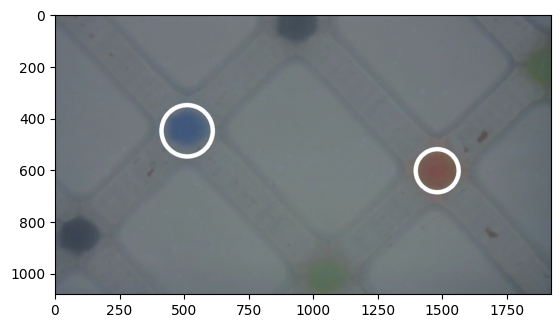

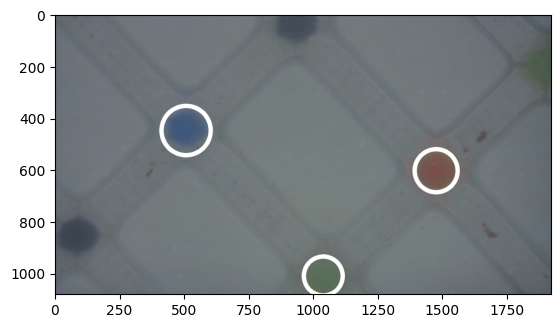

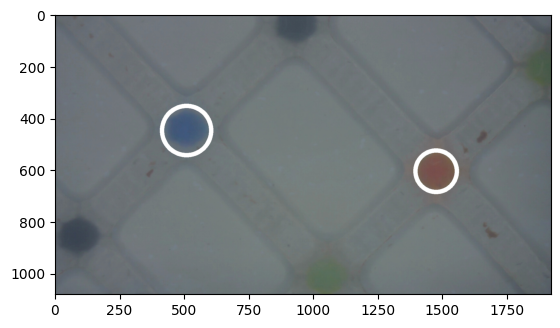

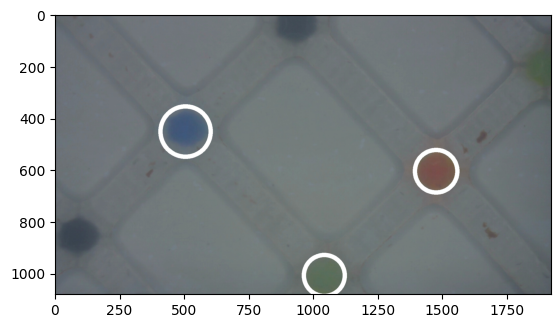

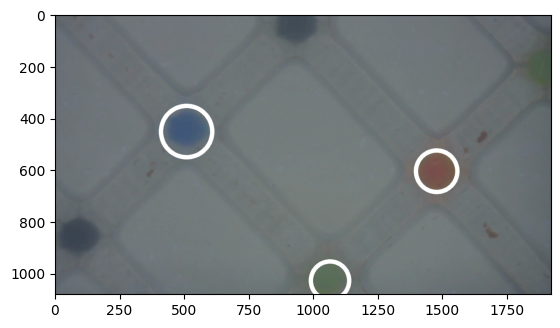

...

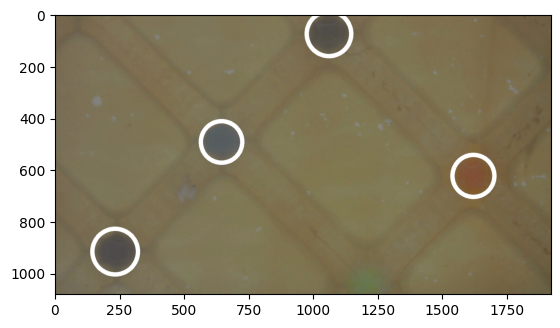

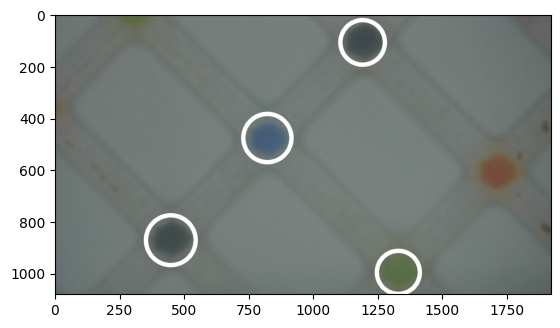

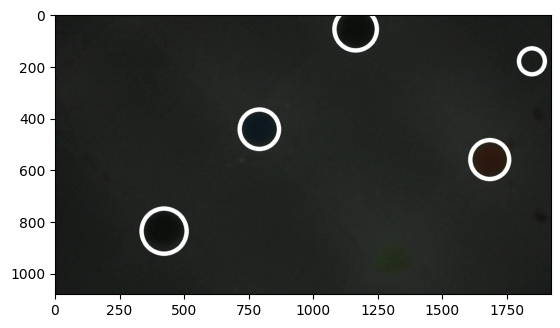

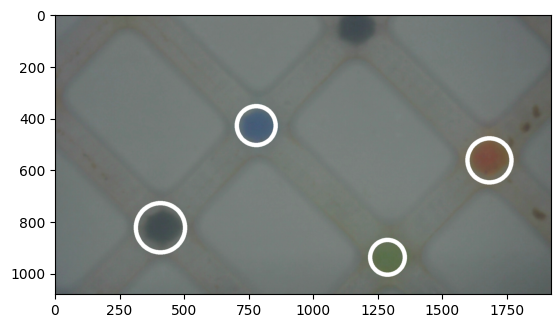

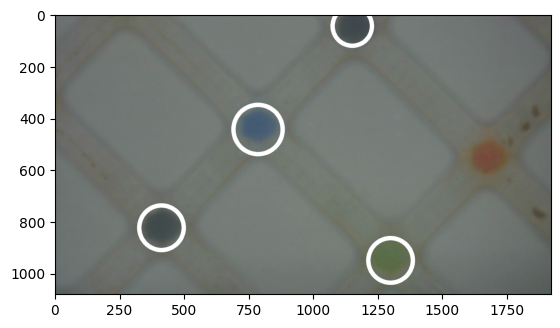

In [ ]:
seq_1 = [os.path.join(sequence_1_folder, img_fn) for img_fn in os.listdir(sequence_1_folder)]
seq_2 = [os.path.join(sequence_2_folder, img_fn) for img_fn in os.listdir(sequence_2_folder)]
seq_3 = [os.path.join(sequence_3_folder, img_fn) for img_fn in os.listdir(sequence_3_folder)]
seq_4 = [os.path.join(sequence_4_folder, img_fn) for img_fn in os.listdir(sequence_4_folder)]

results_seq_1 = track_circles_over_time(seq_1)
results_seq_2 = track_circles_over_time(seq_2)
results_seq_3 = track_circles_over_time(seq_3)
results_seq_4 = track_circles_over_time(seq_4)

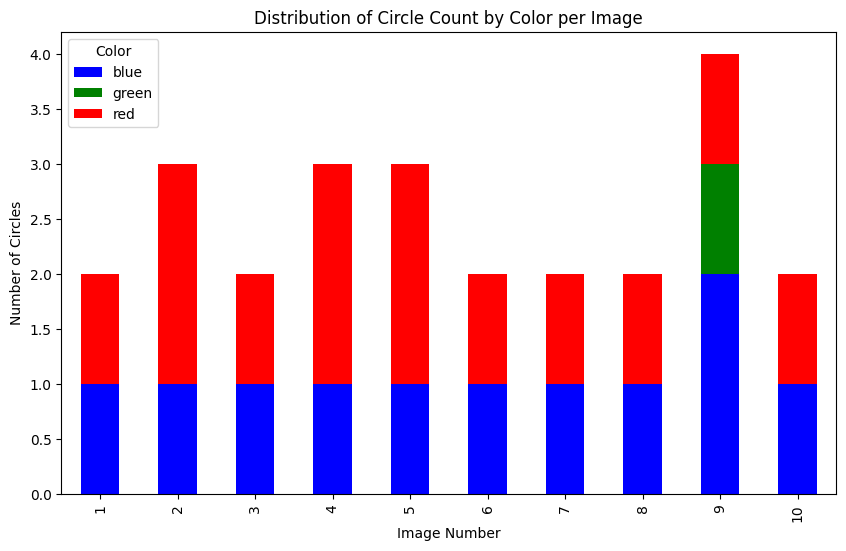

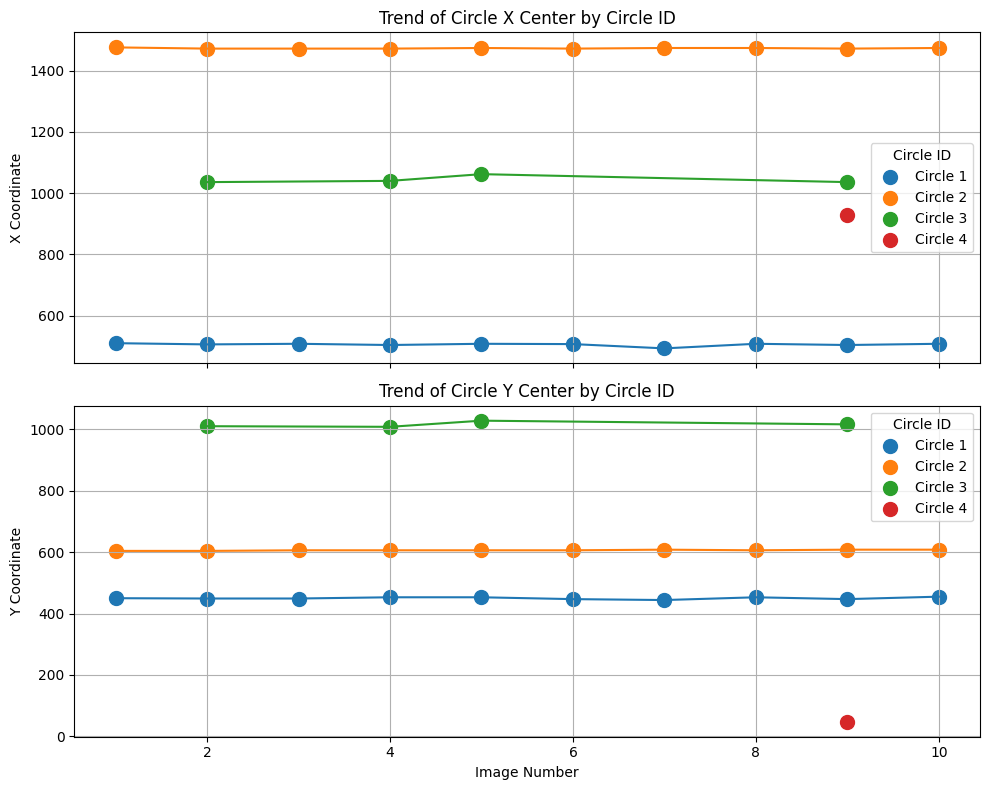

In [ ]:
def show_results(results):
    df = pd.DataFrame(results)

    pivot_table = df.groupby(["image_id", "color"]).size().unstack(fill_value=0)
    colors = pivot_table.columns.tolist()
    pivot_table.plot(kind="bar", stacked=True, figsize=(10, 6), color=colors)
    plt.title("Distribution of Circle Count by Color per Image")
    plt.xlabel("Image Number")
    plt.ylabel("Number of Circles")
    plt.legend(title="Color")
    plt.show()
    
    fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

    # Plot X coordinate trend for each color
    for color in df['color'].unique():
        subset = df[df['color'] == color]
        axes[0].scatter(subset['image_id'], subset['x'], label=color, s=100)
        axes[0].plot(subset['image_id'], subset['x'])
    axes[0].set_title("Trend of Circle X Center")
    axes[0].set_ylabel("X Coordinate")
    axes[0].grid(True)
    axes[0].legend(title="Color")

    # Plot Y coordinate trend for each color
    for color in df['color'].unique():
        subset = df[df['color'] == color]
        axes[1].scatter(subset['image_id'], subset['y'], label=color, s=100)
        axes[1].plot(subset['image_id'], subset['y'])
    axes[1].set_title("Trend of Circle Y Center")
    axes[1].set_xlabel("Image Number")
    axes[1].set_ylabel("Y Coordinate")
    axes[1].grid(True)
    axes[1].legend(title="Color")

    plt.tight_layout()
    plt.show()
    
    plt.close()

show_results(results_seq_1)


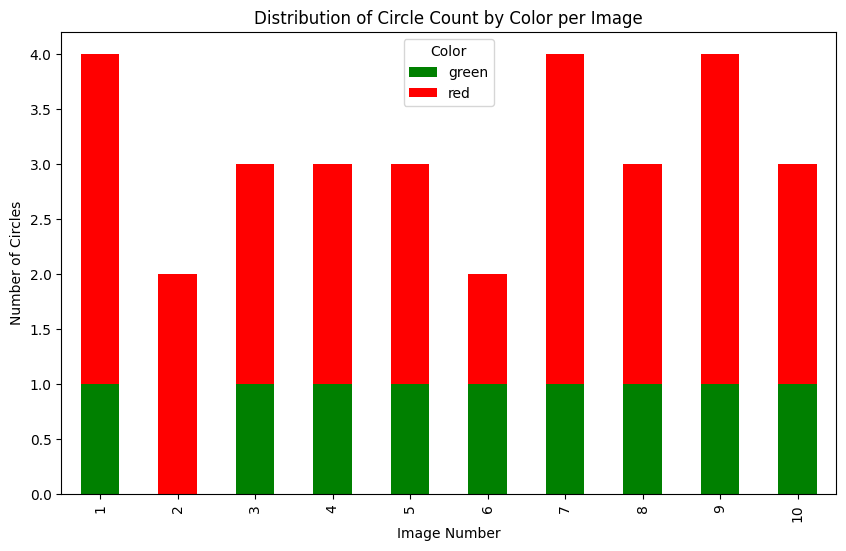

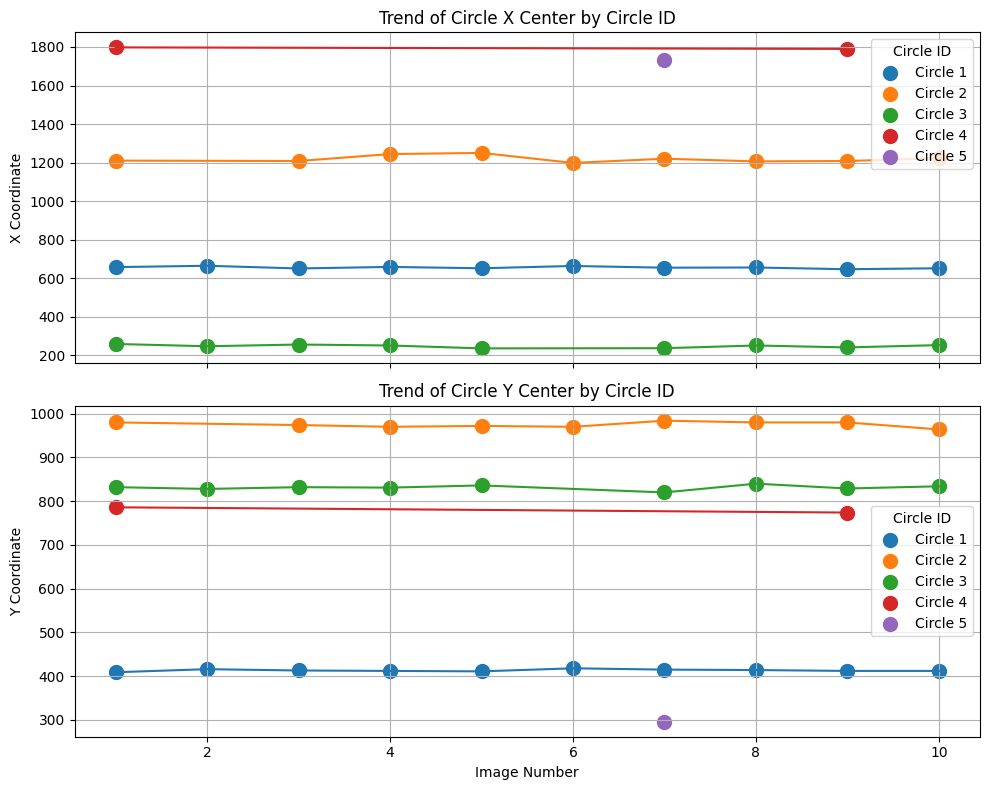

In [ ]:
show_results(results_seq_2)

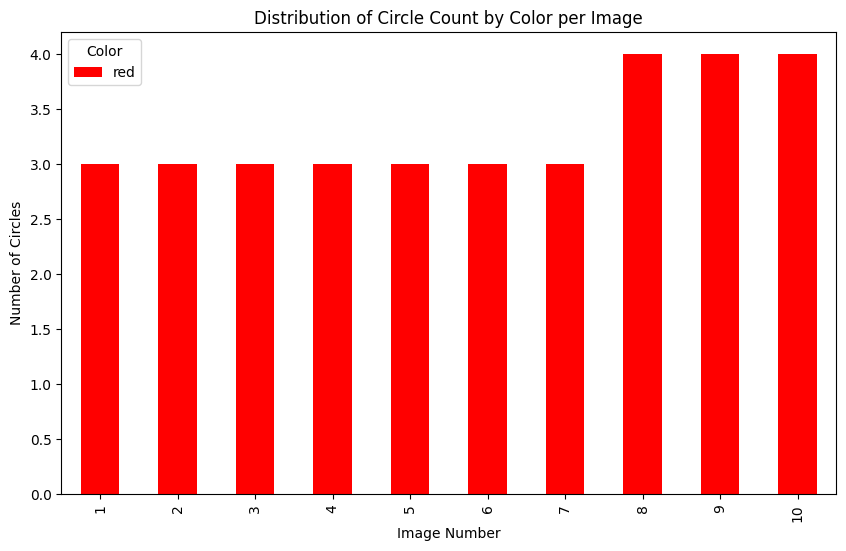

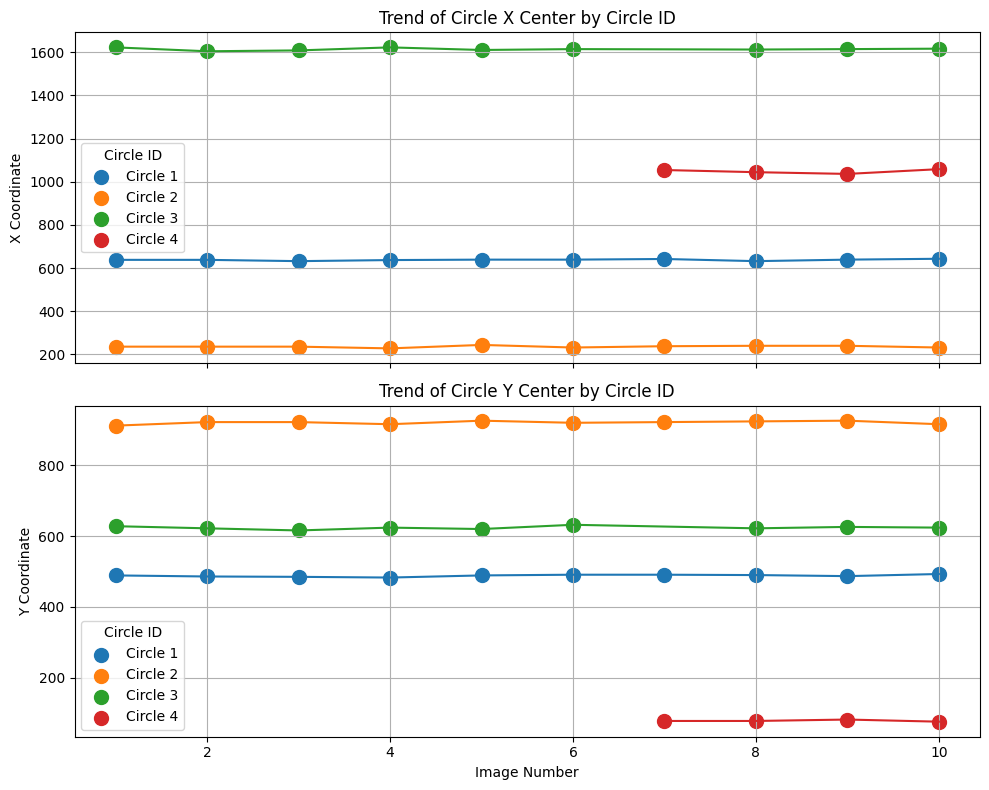

In [ ]:
show_results(results_seq_3)

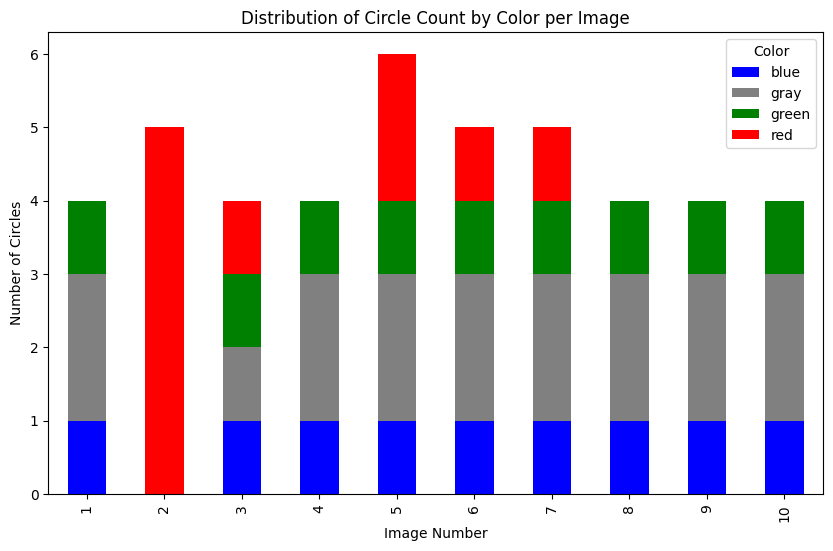

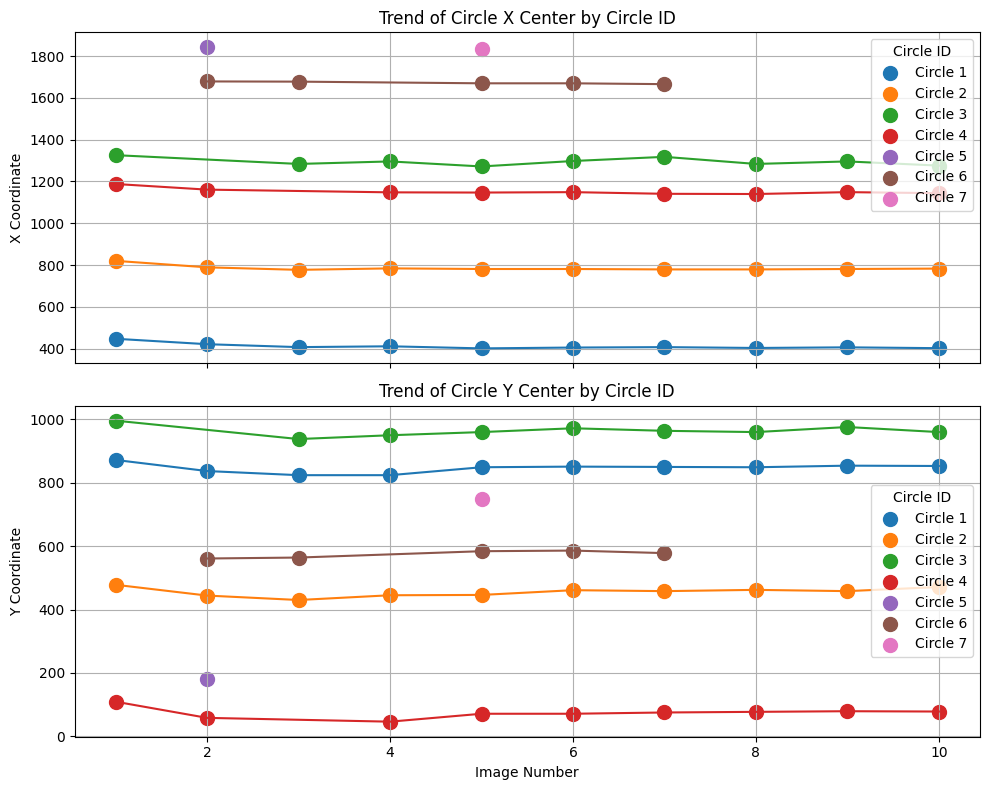

In [ ]:
show_results(results_seq_4)